In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 69.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

#### 0. dataset preprocessing

In [ ]:
from pathlib import Path
from PIL import Image
import random

In [ ]:
# data path
train_path = "/content/drive/MyDrive/25 Witnter DL/data/train/"
upscale_train_path = "/content/drive/MyDrive/25 Witnter DL/data/upscale_train/"

# 폴더 경로
train_folder = Path(train_path)
upscale_train_folder = Path(upscale_train_path)

# 모든 파일명 가져오기 (파일명만 출력)
only_name = [file.stem for file in train_folder.glob("*.jpg")]
train_seq = [file.name for file in train_folder.iterdir() if file.is_file()]
upscale_train_seq = [file.name for file in upscale_train_folder.iterdir() if file.is_file()]

#### 1. YOLOv8n model

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# YOLO 모델 로드 (사전 학습된 모델)
model = YOLO("yolov8n.pt")

In [ ]:
print(len(train_seq))
print(len(upscale_train_seq))

15834
15834


In [ ]:
max_num = len(train_seq)
n = 30  # 뽑을 개수

random_numbers = random.sample(range(max_num), n)
print(random_numbers)

[9881, 1234, 7367, 8418, 7924, 9591, 9633, 13560, 5610, 2123, 7566, 1379, 15389, 12883, 4906, 267, 13367, 8932, 6252, 7296, 11670, 14453, 3564, 3744, 123, 1617, 13860, 15714, 12335, 12940]


In [ ]:
# image drawing function

def draw_image(box, image, image_rgb, image_path, resolution_image_path=None):
    x_min, y_min, x_max, y_max = map(int, box)
    bird_crop = image[y_min:y_max, x_min:x_max]  # 크롭된 이미지
    bird_crop_rgb = cv2.cvtColor(bird_crop, cv2.COLOR_BGR2RGB)  # RGB 변환
    bird_resized = cv2.resize(bird_crop_rgb, (64, 64))  # 크기 조정

    # 원본 이미지에 바운딩 박스 표시
    cv2.rectangle(image_rgb, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)

    # 결과 비교 시각화
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # 원본 저행상도 이미지
    row_image = Image.open(resolution_image_path)
    axes[0].imshow(row_image)
    axes[0].set_title("Before (Original Image with low resolution)")
    axes[0].axis("off")

    # 원본 이미지 (탐지된 바운딩 박스 포함)
    axes[1].imshow(image_rgb)
    axes[1].set_title("Before (Original Image with Bounding Box)")
    axes[1].axis("off")

    # 크롭된 조류 이미지
    axes[2].imshow(bird_resized)
    axes[2].set_title("After (Cropped & Resized Bird)")
    axes[2].axis("off")

    plt.show()

In [ ]:
# image detector

def image_detector(image_path, resolution_image_path=None):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV는 BGR이므로 RGB로 변환

    # 객체 탐지 실행
    results = model(image, imgsz=1024)

    # 조류 탐지 후 크롭
    largest_box = None
    max_area = 0

    for result in results:
        for box in result.boxes:
            cls_id = int(box.cls[0])  # 클래스 ID
            if cls_id == 14:  # 'bird' 클래스 ID (YOLOv8에 따라 다를 수 있음)
                x_min, y_min, x_max, y_max = map(int, box.xyxy[0])
                area = (x_max - x_min) * (y_max - y_min)  # 박스 면적 계산

                # 가장 큰 박스 업데이트
                if area > max_area:
                    max_area = area
                    largest_box = (x_min, y_min, x_max, y_max)

    # 크롭 실행
    if largest_box:
        draw_image(largest_box, image, image_rgb, image_path, resolution_image_path)
    else:
        print("조류를 찾지 못했습니다.")

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

9881  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_06715.jpg 


0: 1024x1024 (no detections), 609.2ms
Speed: 11.4ms preprocess, 609.2ms inference, 2.5ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 (no detections), 622.6ms
Speed: 11.8ms preprocess, 622.6ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

1234  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_14068.jpg 


0: 1024x1024 (no detections), 596.7ms
Speed: 10.6ms preprocess, 596.7ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 (no detections), 611.9ms
Speed: 11.0ms preprocess, 611.9ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

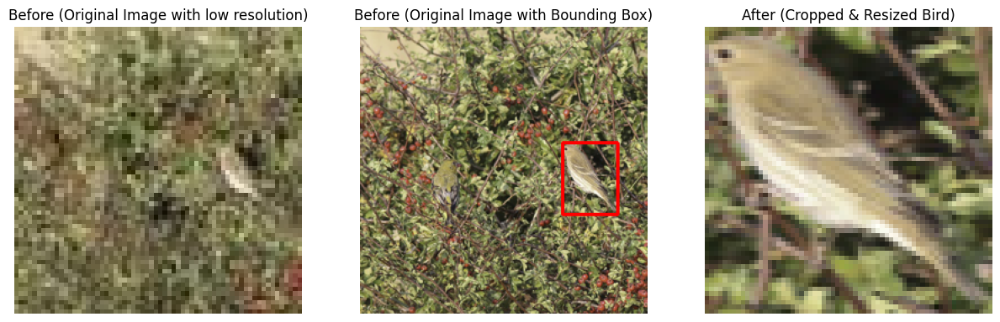



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

8418  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_07252.jpg 


0: 1024x1024 (no detections), 877.1ms
Speed: 18.6ms preprocess, 877.1ms inference, 2.8ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 910.1ms
Speed: 14.8ms preprocess, 910.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


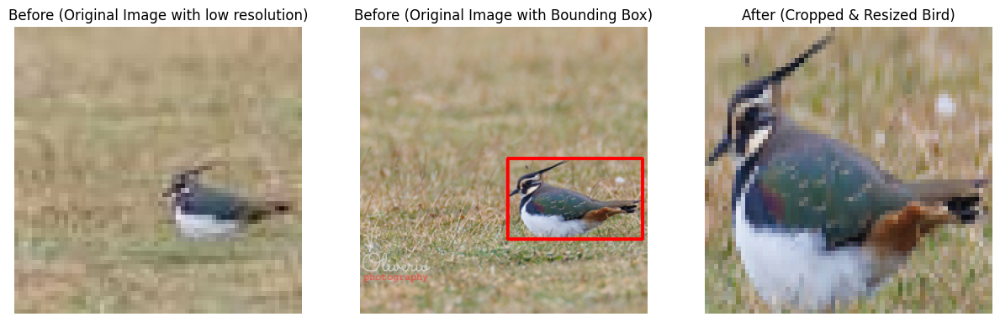



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

7924  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_08758.jpg 


0: 1024x1024 (no detections), 919.8ms
Speed: 16.4ms preprocess, 919.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 person, 760.7ms
Speed: 13.0ms preprocess, 760.7ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

9591  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_06425.jpg 


0: 1024x1024 (no detections), 626.2ms
Speed: 13.3ms preprocess, 626.2ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 1 cow, 662.4ms
Speed: 17.9ms preprocess, 662.4ms inference, 2.8ms postprocess per image at shape (1, 3, 1024, 1024)


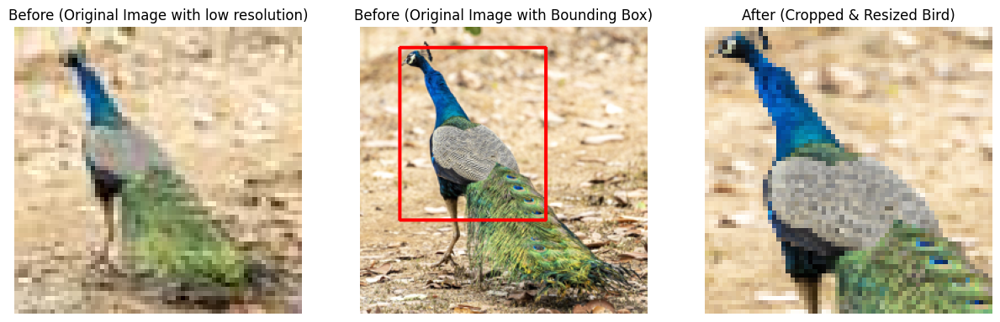



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

9633  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_06467.jpg 


0: 1024x1024 (no detections), 621.8ms
Speed: 12.3ms preprocess, 621.8ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 person, 1 bird, 611.6ms
Speed: 14.4ms preprocess, 611.6ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)


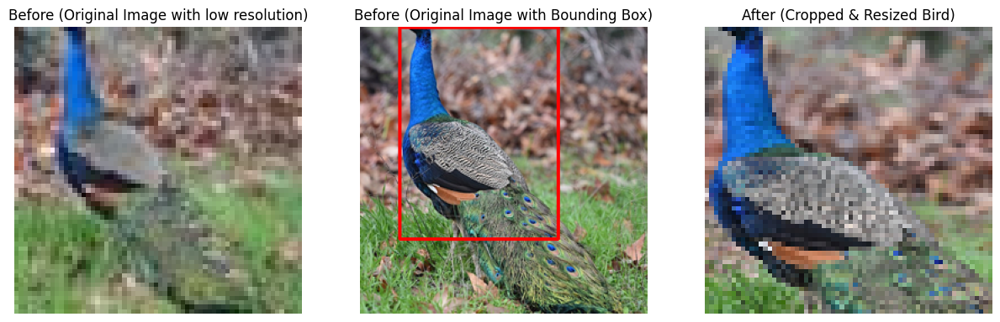



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

13560  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_02394.jpg 


0: 1024x1024 (no detections), 611.7ms
Speed: 12.4ms preprocess, 611.7ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 person, 1 bird, 614.0ms
Speed: 14.5ms preprocess, 614.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)


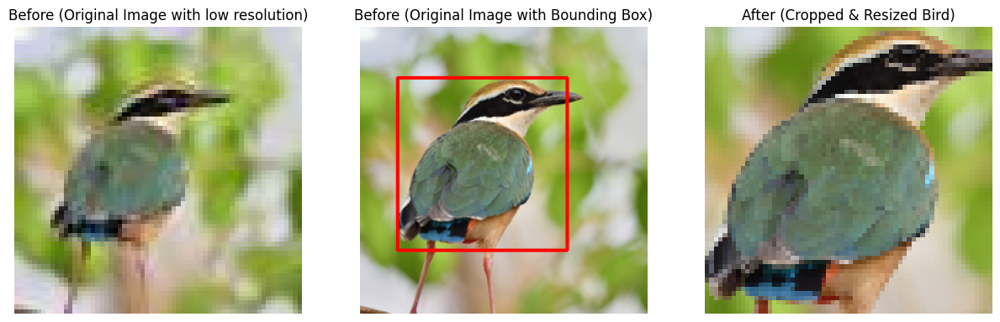



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

5610  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_10444.jpg 


0: 1024x1024 (no detections), 611.9ms
Speed: 13.4ms preprocess, 611.9ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 613.8ms
Speed: 14.7ms preprocess, 613.8ms inference, 2.7ms postprocess per image at shape (1, 3, 1024, 1024)


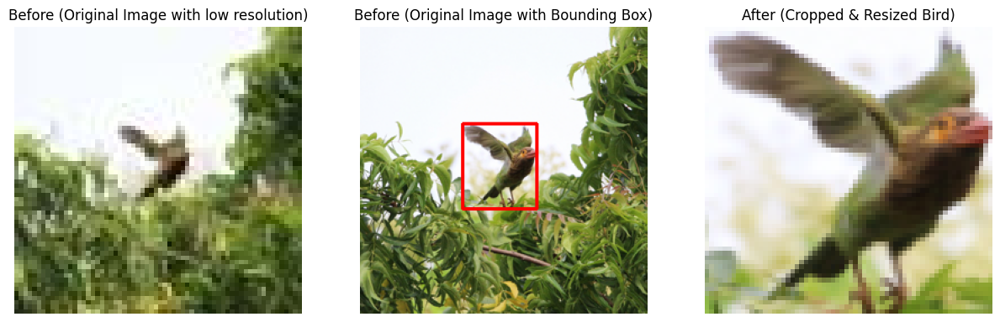



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2123  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_12957.jpg 


0: 1024x1024 (no detections), 652.0ms
Speed: 13.6ms preprocess, 652.0ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 cake, 699.0ms
Speed: 12.6ms preprocess, 699.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

7566  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_08400.jpg 


0: 1024x1024 (no detections), 903.3ms
Speed: 18.6ms preprocess, 903.3ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 881.0ms
Speed: 15.6ms preprocess, 881.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)


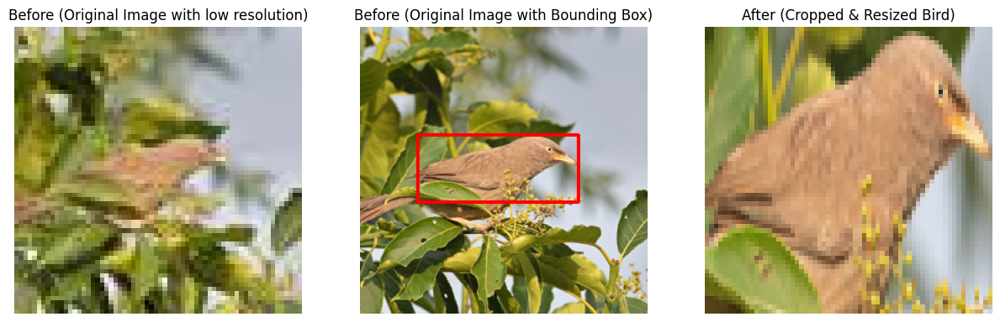



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

1379  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_14213.jpg 


0: 1024x1024 (no detections), 954.0ms
Speed: 17.0ms preprocess, 954.0ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 941.5ms
Speed: 15.4ms preprocess, 941.5ms inference, 2.7ms postprocess per image at shape (1, 3, 1024, 1024)


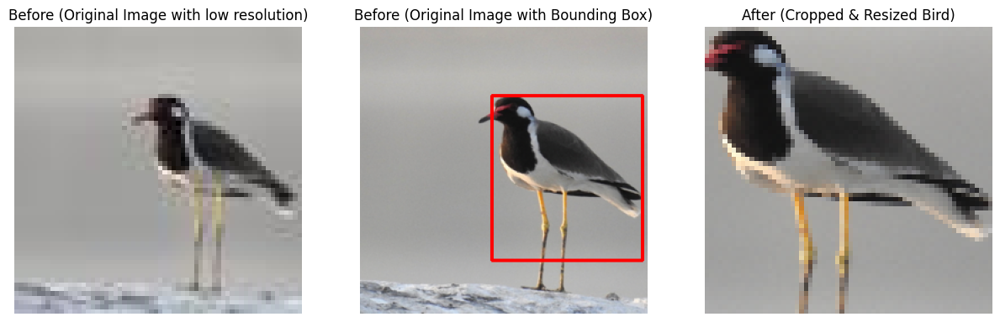



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

15389  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_00389.jpg 


0: 1024x1024 (no detections), 754.0ms
Speed: 51.9ms preprocess, 754.0ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 1 frisbee, 618.4ms
Speed: 18.3ms preprocess, 618.4ms inference, 2.5ms postprocess per image at shape (1, 3, 1024, 1024)


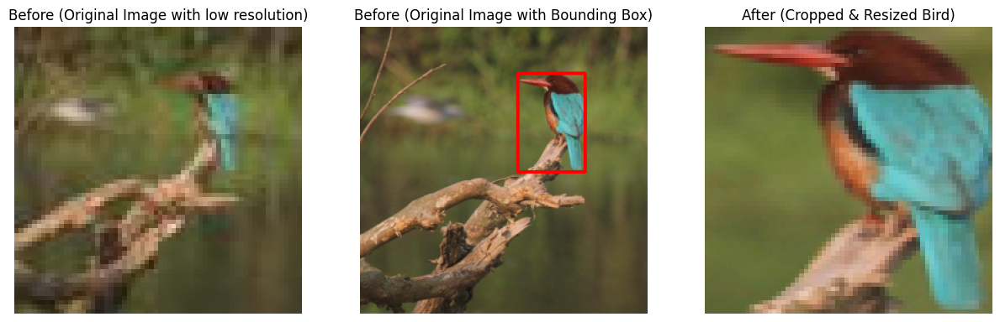



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

12883  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_03717.jpg 


0: 1024x1024 (no detections), 665.0ms
Speed: 11.9ms preprocess, 665.0ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 (no detections), 604.8ms
Speed: 12.9ms preprocess, 604.8ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

4906  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_11740.jpg 


0: 1024x1024 (no detections), 1042.6ms
Speed: 13.7ms preprocess, 1042.6ms inference, 12.7ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 2 birds, 684.6ms
Speed: 29.4ms preprocess, 684.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)


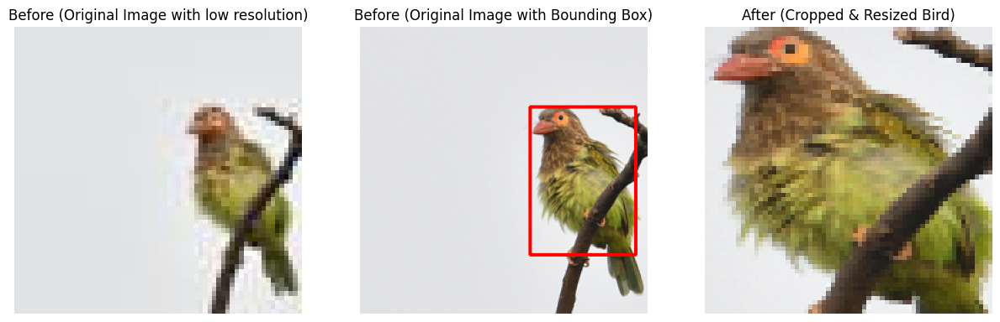



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

267  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_15101.jpg 


0: 1024x1024 (no detections), 665.1ms
Speed: 14.2ms preprocess, 665.1ms inference, 2.7ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 (no detections), 636.0ms
Speed: 76.2ms preprocess, 636.0ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

13367  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_02201.jpg 


0: 1024x1024 (no detections), 910.7ms
Speed: 17.6ms preprocess, 910.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 906.4ms
Speed: 16.2ms preprocess, 906.4ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)


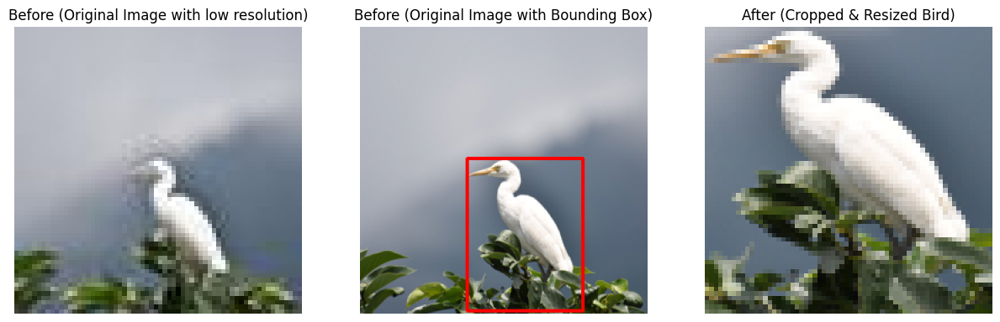



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

8932  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_07766.jpg 


0: 1024x1024 (no detections), 977.9ms
Speed: 14.0ms preprocess, 977.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 (no detections), 603.4ms
Speed: 20.0ms preprocess, 603.4ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

6252  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_09086.jpg 


0: 1024x1024 (no detections), 629.9ms
Speed: 13.4ms preprocess, 629.9ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 656.2ms
Speed: 12.6ms preprocess, 656.2ms inference, 2.6ms postprocess per image at shape (1, 3, 1024, 1024)


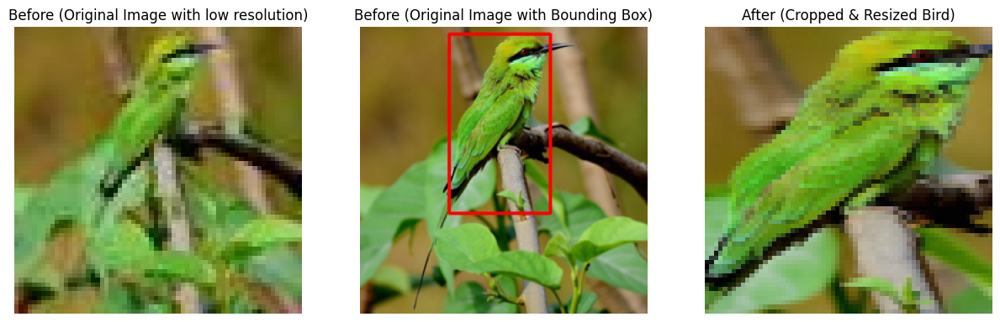



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

7296  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_08130.jpg 


0: 1024x1024 (no detections), 597.0ms
Speed: 12.4ms preprocess, 597.0ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 3 birds, 608.9ms
Speed: 13.8ms preprocess, 608.9ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)


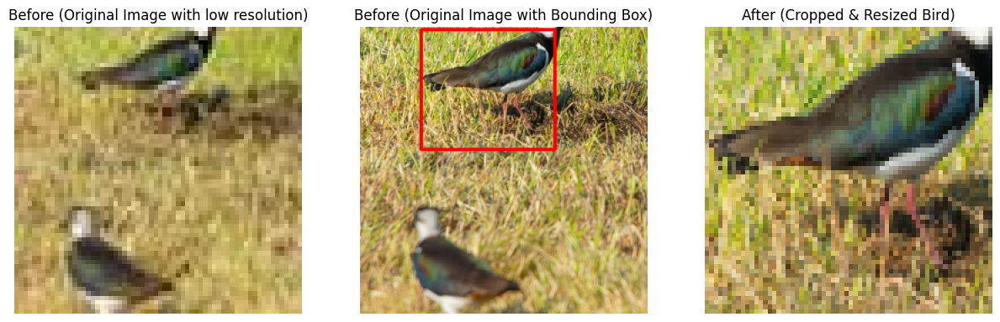



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

11670  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_04504.jpg 


0: 1024x1024 (no detections), 605.8ms
Speed: 13.4ms preprocess, 605.8ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 2 birds, 602.6ms
Speed: 13.9ms preprocess, 602.6ms inference, 2.8ms postprocess per image at shape (1, 3, 1024, 1024)


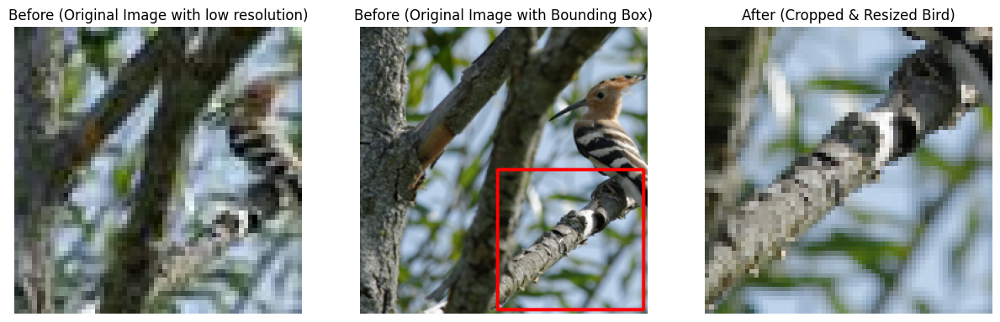



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

14453  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_01287.jpg 


0: 1024x1024 (no detections), 618.5ms
Speed: 11.9ms preprocess, 618.5ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 1 giraffe, 633.8ms
Speed: 14.9ms preprocess, 633.8ms inference, 2.8ms postprocess per image at shape (1, 3, 1024, 1024)


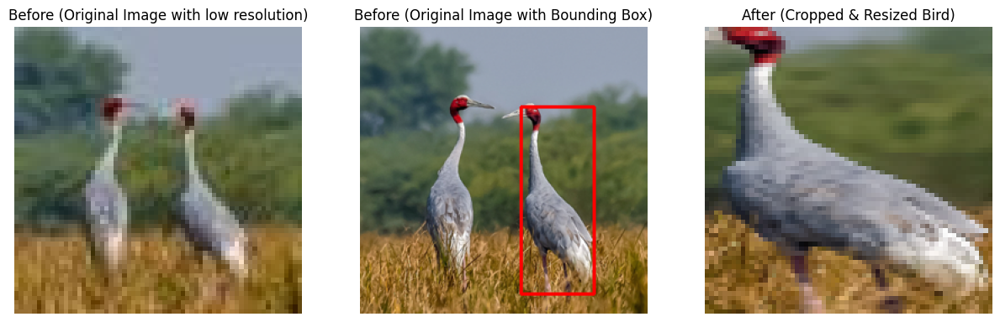



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

3564  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_12398.jpg 


0: 1024x1024 1 vase, 906.1ms
Speed: 22.9ms preprocess, 906.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 1 giraffe, 908.4ms
Speed: 15.6ms preprocess, 908.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)


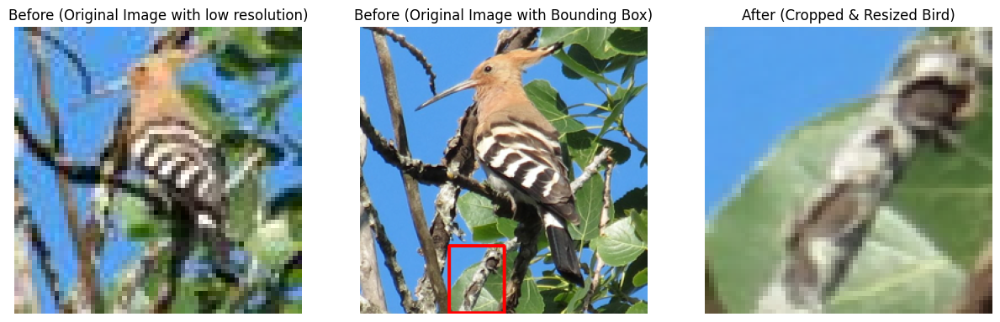



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

3744  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_12578.jpg 


0: 1024x1024 (no detections), 937.7ms
Speed: 17.3ms preprocess, 937.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 986.1ms
Speed: 17.1ms preprocess, 986.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


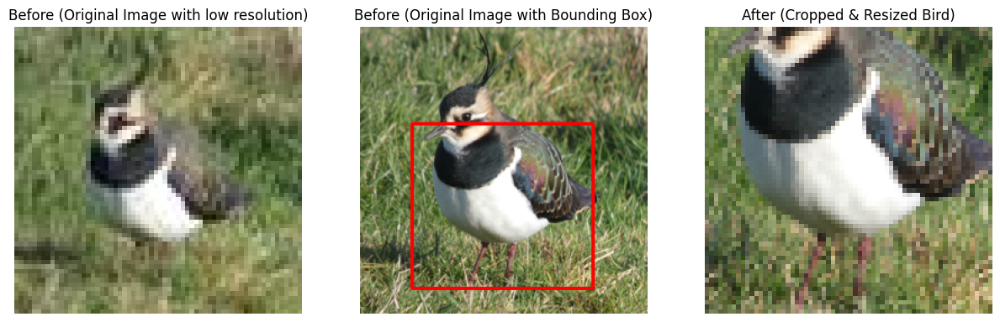



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

123  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_14957.jpg 


0: 1024x1024 (no detections), 630.6ms
Speed: 14.2ms preprocess, 630.6ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 625.5ms
Speed: 14.8ms preprocess, 625.5ms inference, 2.7ms postprocess per image at shape (1, 3, 1024, 1024)


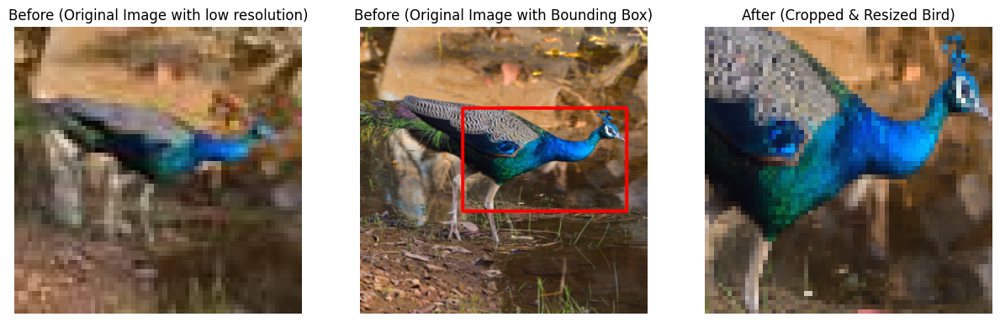



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

1617  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_14451.jpg 


0: 1024x1024 (no detections), 616.8ms
Speed: 16.4ms preprocess, 616.8ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 (no detections), 652.4ms
Speed: 62.0ms preprocess, 652.4ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

13860  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_02694.jpg 


0: 1024x1024 (no detections), 650.0ms
Speed: 15.7ms preprocess, 650.0ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 person, 644.3ms
Speed: 12.9ms preprocess, 644.3ms inference, 2.6ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

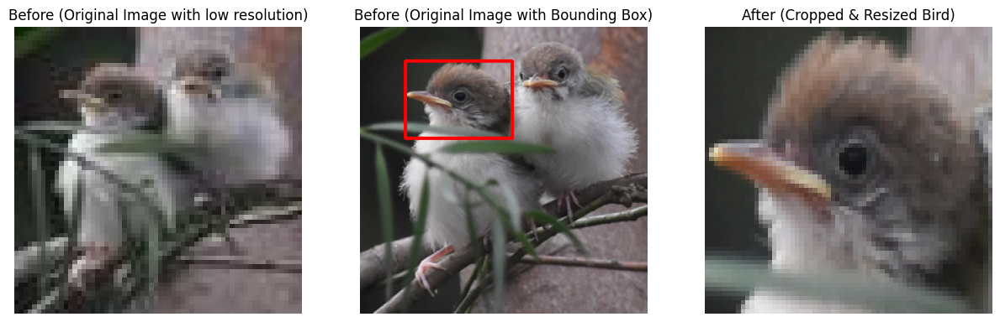



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

12940  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_03774.jpg 


0: 1024x1024 (no detections), 1256.7ms
Speed: 13.4ms preprocess, 1256.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)
조류를 찾지 못했습니다.

0: 1024x1024 1 bird, 971.4ms
Speed: 17.8ms preprocess, 971.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


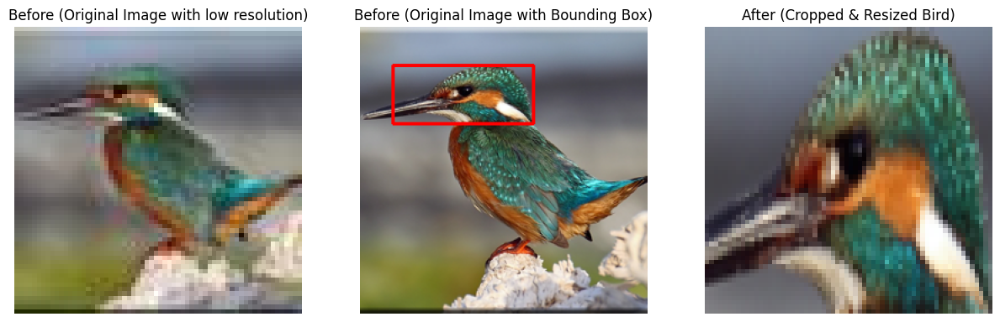

In [ ]:
for i in random_numbers:
    image_path = train_path + only_name[i] + '.jpg'
    upscale_image_path = upscale_train_path + only_name[i] + '.png'

    print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@\n")
    print(i, " 번째 image : ", image_path, "\n")
    image_detector(image_path)
    image_detector(upscale_image_path, image_path)
    print('\n')

#### 2. U-Net model

In [ ]:
import torch
import torchvision
from torchvision import transforms
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 모델 로드 (SSD with MobileNet V3 backbone)
model = torchvision.models.detection.ssd300_vgg16(pretrained=True)
model.eval()  # 평가 모드로 설정

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [ ]:
# image detector

def detect_bird_ssd(image_path, resolution_image_path=None):
    # 원본 이미지 로드
    image = cv2.imread(image_path)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV는 BGR이므로 RGB 변환
    orig_height, orig_width, _ = image.shape  # 원본 이미지 크기 유지

    # 전처리 (Tensor 변환, 이미지 크기 유지)
    transform = transforms.Compose([transforms.ToPILImage(), transforms.ToTensor()])
    image_tensor = transform(image_rgb).unsqueeze(0)  # (1, 3, H, W)

    # 모델 예측 실행
    with torch.no_grad():
        outputs = model(image_tensor)

    # 바운딩 박스 및 라벨 추출
    boxes = outputs[0]["boxes"].numpy()
    scores = outputs[0]["scores"].numpy()
    labels = outputs[0]["labels"].numpy()

    # 조류(Bird) 클래스 ID = 15 (COCO 데이터셋 기준)
    bird_boxes = []
    bird_scores = []
    for box, score, label in zip(boxes, scores, labels):
        if label == 16 and score > 0.5:  # 신뢰도 50% 이상인 조류만 선택
            bird_boxes.append(box)
            bird_scores.append(score)

    if bird_boxes:
        # 신뢰도가 가장 높은 박스 선택
        best_idx = np.argmax(bird_scores)
        best_bbox = bird_boxes[best_idx]

        draw_image(best_bbox, image, image_rgb, image_path, resolution_image_path)
    else:
        print("조류를 감지하지 못했습니다.\n")


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

9881  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_06715.jpg 

조류를 감지하지 못했습니다.



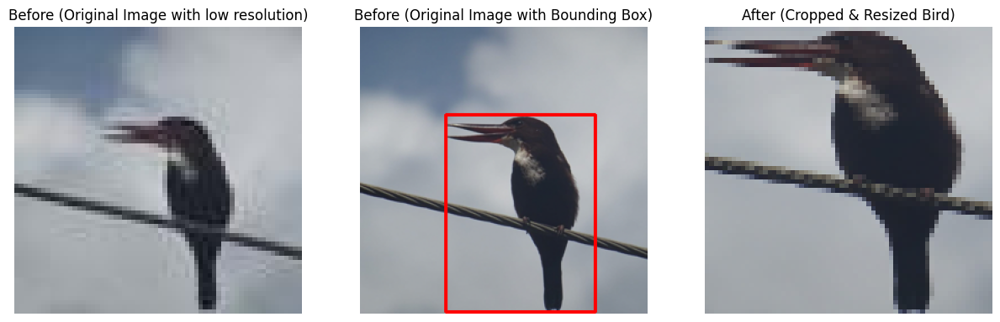



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

1234  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_14068.jpg 

조류를 감지하지 못했습니다.



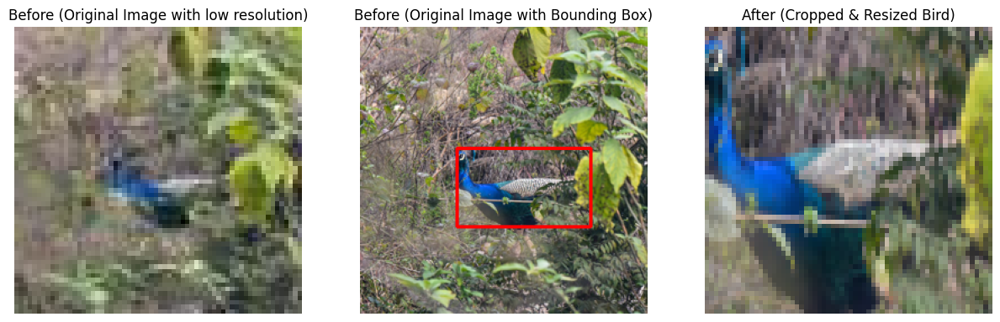



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

7367  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_08201.jpg 

조류를 감지하지 못했습니다.



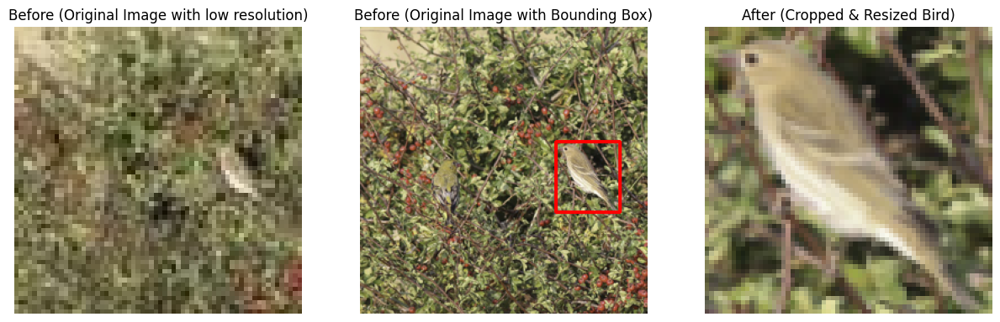



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

8418  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_07252.jpg 

조류를 감지하지 못했습니다.



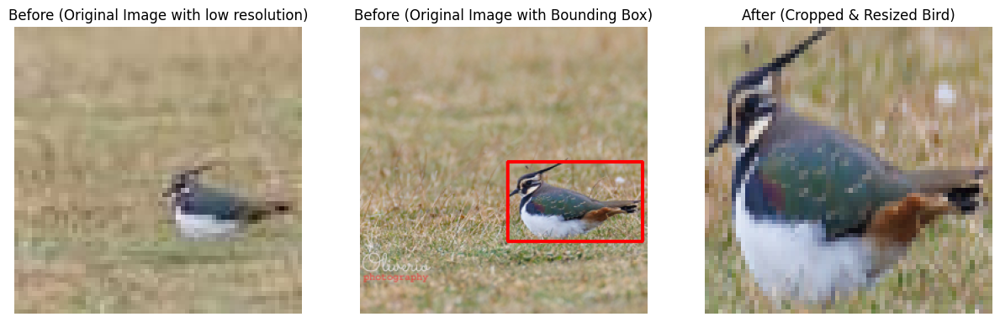



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

7924  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_08758.jpg 

조류를 감지하지 못했습니다.



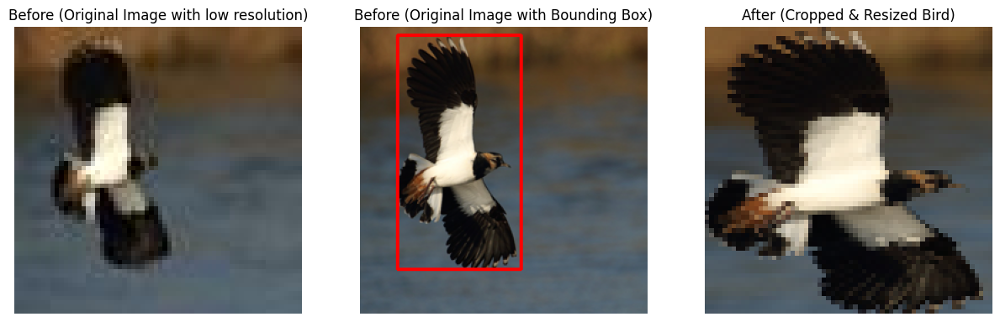



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

9591  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_06425.jpg 

조류를 감지하지 못했습니다.



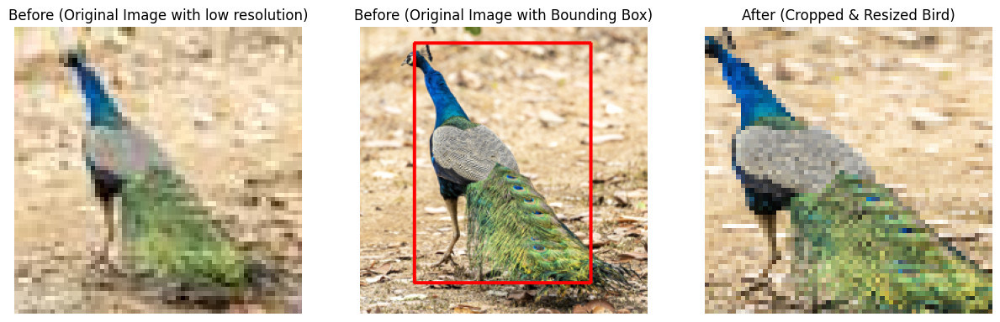



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

9633  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_06467.jpg 

조류를 감지하지 못했습니다.



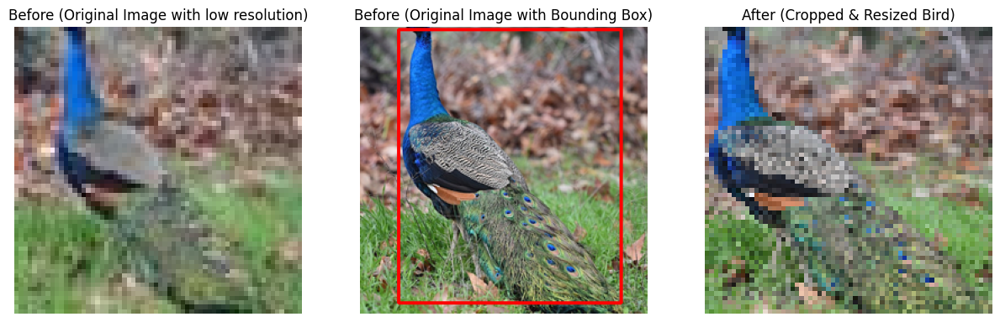



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

13560  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_02394.jpg 

조류를 감지하지 못했습니다.



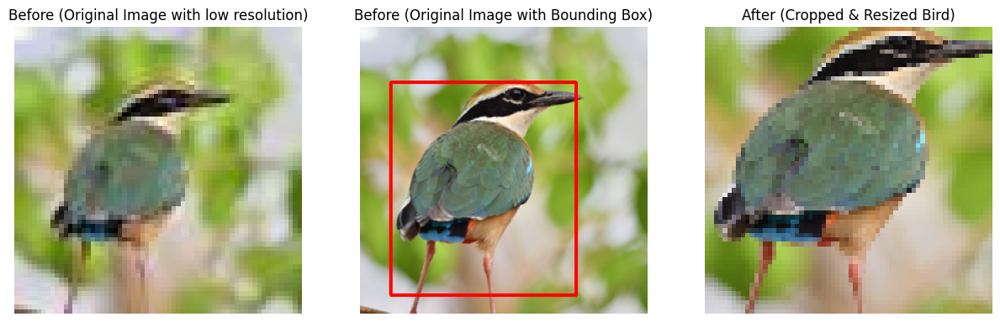



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

5610  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_10444.jpg 

조류를 감지하지 못했습니다.



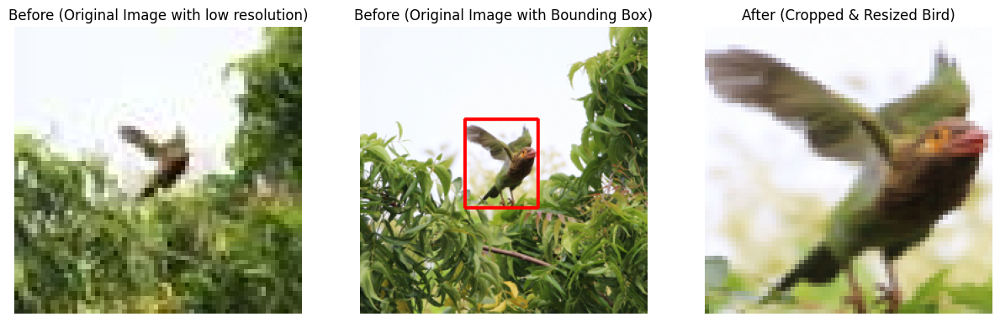



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2123  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_12957.jpg 

조류를 감지하지 못했습니다.



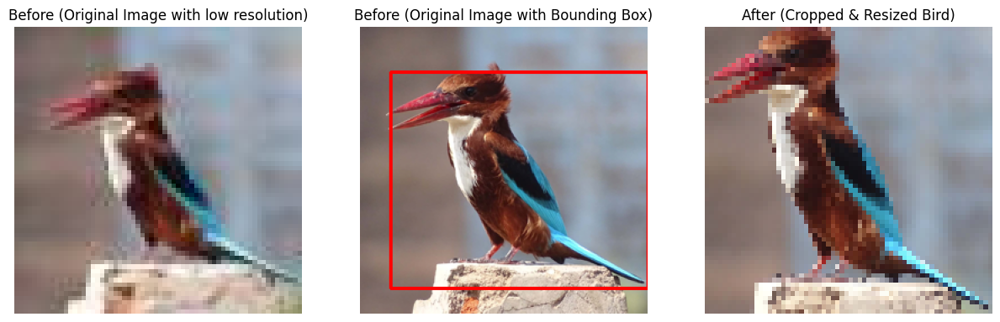



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

7566  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_08400.jpg 

조류를 감지하지 못했습니다.

조류를 감지하지 못했습니다.



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

1379  번째 image :  /content/drive/MyDrive/25 Witnter DL/data/train/TRAIN_14213.jpg 



AttributeError: 'NoneType' object has no attribute 'read'

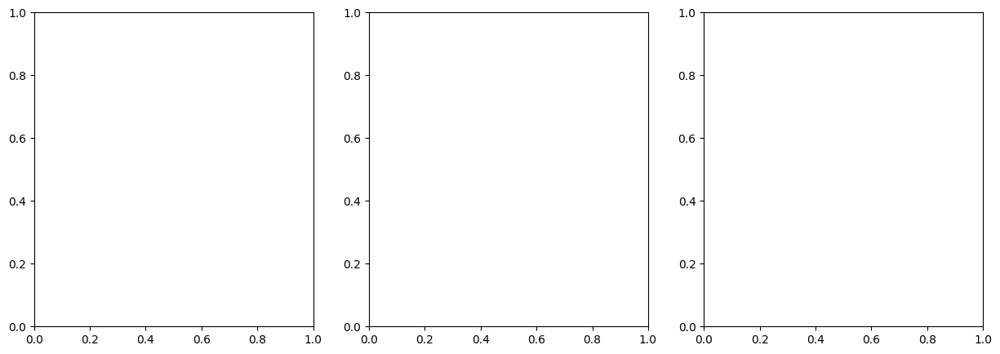

In [ ]:
for i in random_numbers:
    image_path = train_path + only_name[i] + '.jpg'
    upscale_image_path = upscale_train_path + only_name[i] + '.png'

    print("@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@\n")
    print(i, " 번째 image : ", image_path, "\n")
    detect_bird_ssd(image_path)
    detect_bird_ssd(upscale_image_path, image_path)
    print('\n')